In [1]:
import numpy as np
import matplotlib.pyplot as plt

import cv2
import scipy
from tensorflow.keras.preprocessing.image import ImageDataGenerator

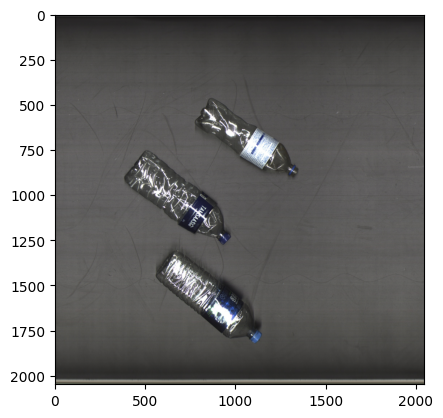

In [2]:
# cv2.imread는 이미지를 RGB가 아닌 BGR로 받아오기 때문에 바꿔야 함
image = cv2.cvtColor(cv2.imread('C:/python/recycle/data/images/test/PET_001_1831.jpg'), cv2.COLOR_BGR2RGB)
plt.imshow(image)

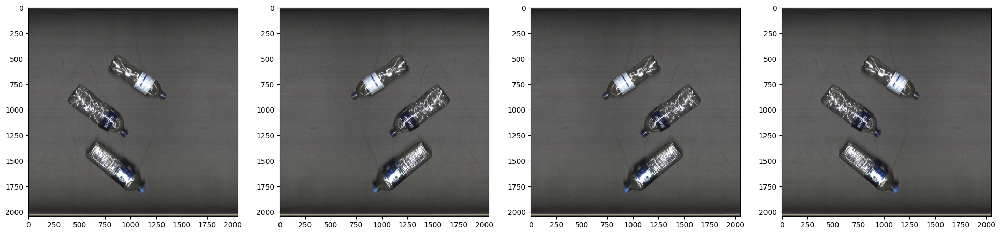

In [3]:
#augmentation이 적용된 image들을 시각화 해주는 함수
def show_aug_image(image, generator, n_images=4):
	
    # ImageDataGenerator는 여러개의 image를 입력으로 받기 때문에 4차원으로 입력 해야함.
    image_batch = np.expand_dims(image, axis=0)
	
    # featurewise_center or featurewise_std_normalization or zca_whitening 가 True일때만 fit 해주어야함
    generator.fit(image_batch) 
    # flow로 image batch를 generator에 넣어주어야함.
    data_gen_iter = generator.flow(image_batch)

    fig, axs = plt.subplots(nrows=1, ncols=n_images, figsize=(24, 8))

    for i in range(n_images):
    	#generator에 batch size 만큼 augmentation 적용(매번 적용이 다름)
        aug_image_batch = next(data_gen_iter)
        aug_image = np.squeeze(aug_image_batch)
        aug_image = aug_image.astype('int')
        axs[i].imshow(aug_image)
data_generator = ImageDataGenerator(horizontal_flip=True)
show_aug_image(image, data_generator, n_images=4)

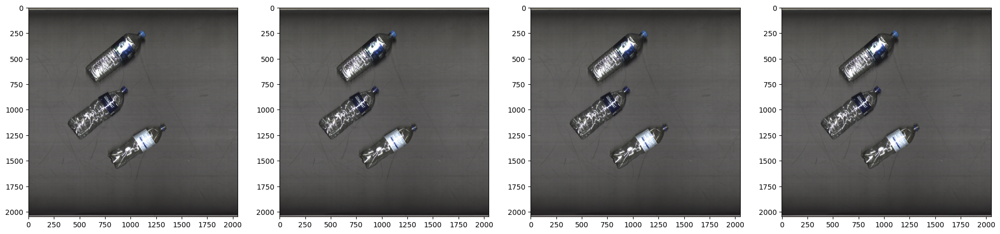

In [4]:
data_generator = ImageDataGenerator(vertical_flip=True)
show_aug_image(image, data_generator, n_images=4)

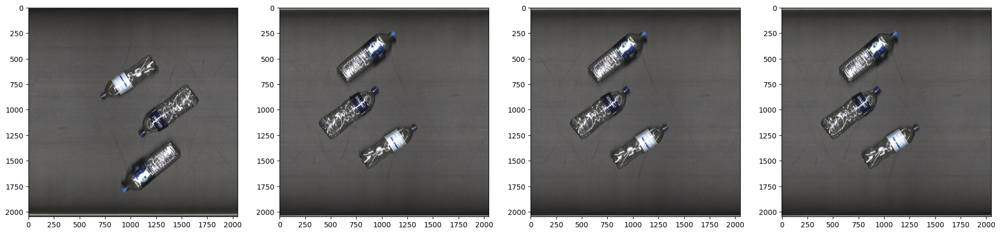

In [5]:
data_generator = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
show_aug_image(image, data_generator, n_images=4)

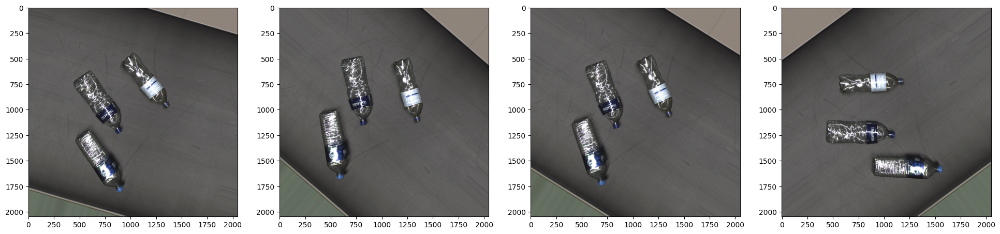

In [12]:
data_generator = ImageDataGenerator(rotation_range=45)
show_aug_image(image, data_generator, n_images=4)

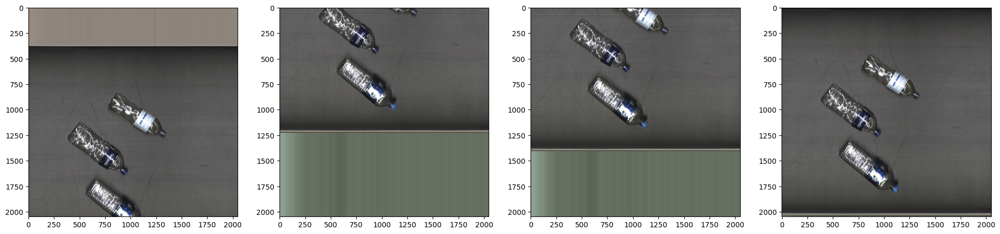

In [13]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='nearest')
show_aug_image(image, data_generator, n_images=4)

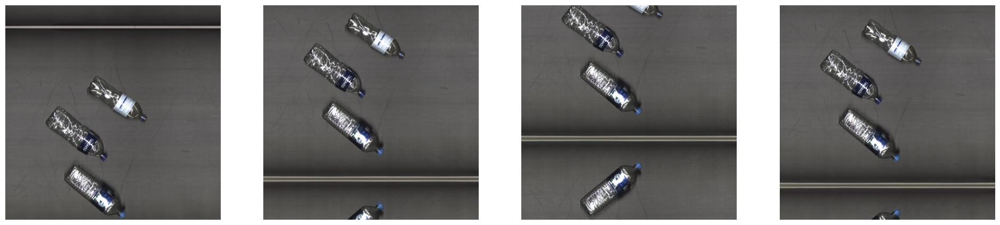

In [14]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='reflect')
show_aug_image(image, data_generator, n_images=4)

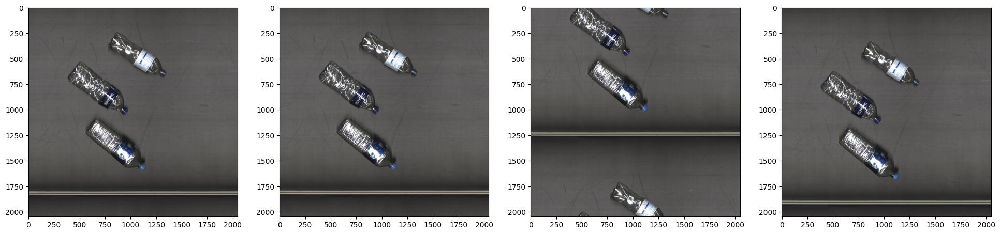

In [15]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='wrap')
show_aug_image(image, data_generator, n_images=4)

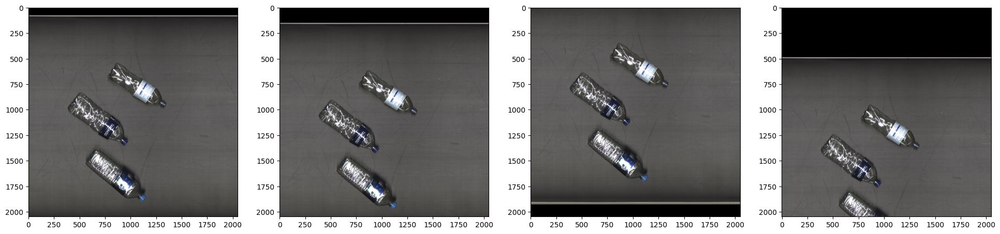

In [16]:
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='constant', cval=0)
show_aug_image(image, data_generator, n_images=4)

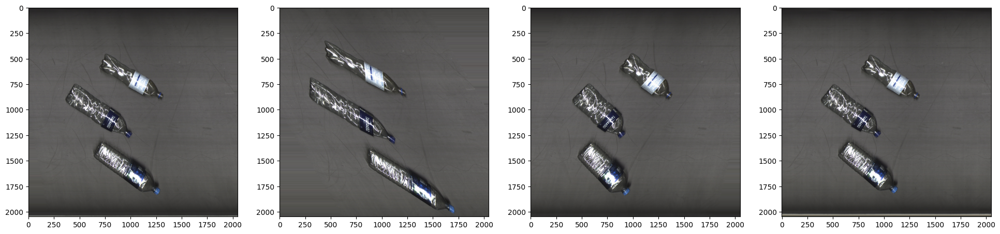

In [17]:
data_generator = ImageDataGenerator(shear_range=45)
show_aug_image(image, data_generator, n_images=4)

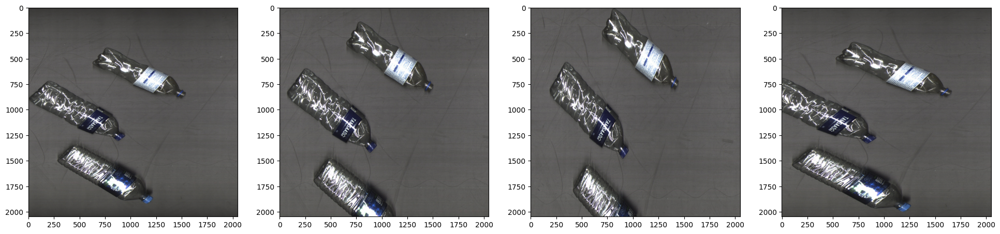

In [18]:
data_generator = ImageDataGenerator(zoom_range=[0.5, 0.9])
show_aug_image(image, data_generator, n_images=4)

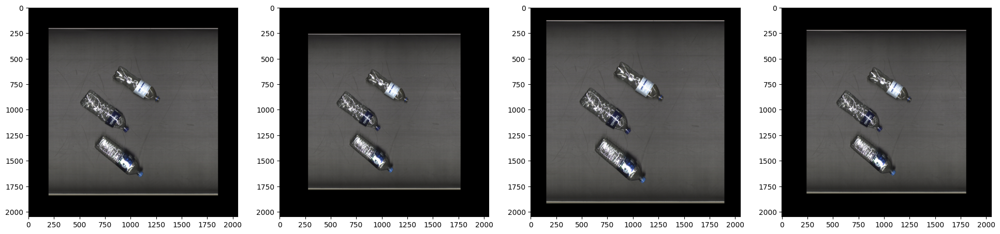

In [19]:
data_generator = ImageDataGenerator(zoom_range=[1.1, 1.5], fill_mode='constant', cval=0)
show_aug_image(image, data_generator, n_images=4)

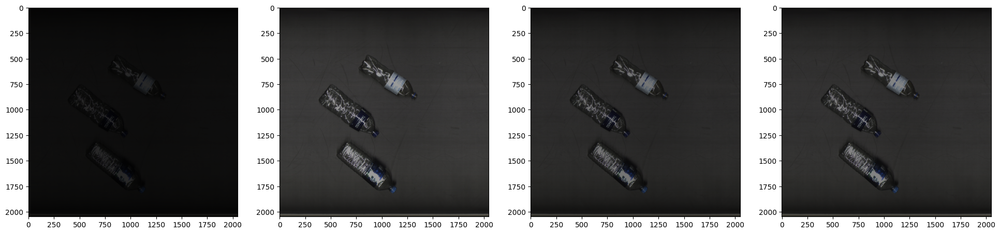

In [20]:
data_generator = ImageDataGenerator(brightness_range=(0.1, 0.9))
show_aug_image(image, data_generator, n_images=4)

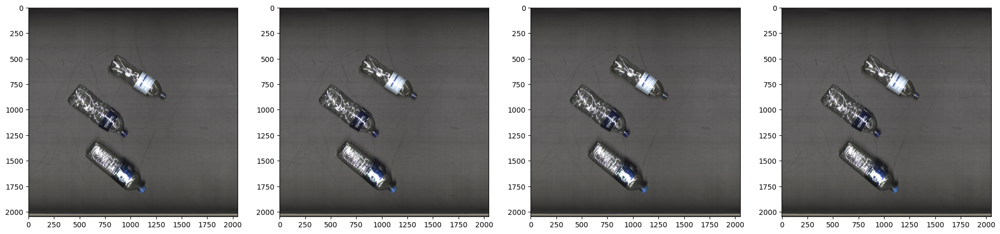

In [21]:
data_generator = ImageDataGenerator(brightness_range=(1.0, 1.0))
show_aug_image(image, data_generator, n_images=4)

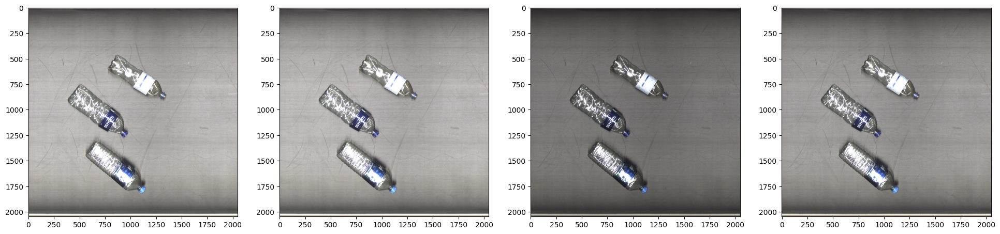

In [22]:
data_generator = ImageDataGenerator(brightness_range=(1.0, 2.0))
show_aug_image(image, data_generator, n_images=4)

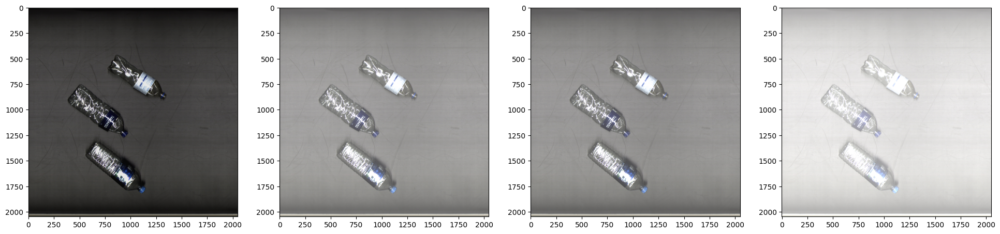

In [23]:
data_generator = ImageDataGenerator(channel_shift_range=150)
show_aug_image(image, data_generator, n_images=4)

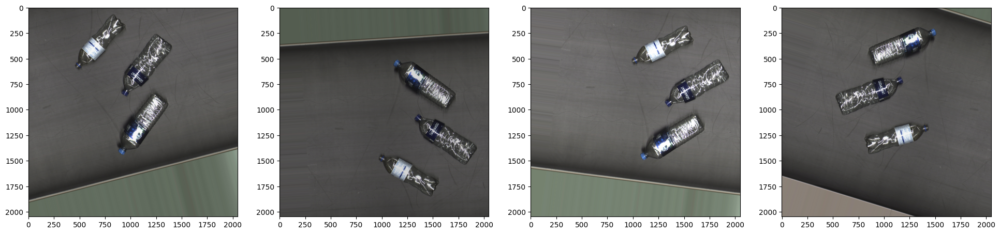

In [24]:
data_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=(0.7, 1.3),
    horizontal_flip=True,
    vertical_flip=True,
    #rescale=1/255.0 # 학습시 적용, 시각화를 위해 임시로 주석처리
)

show_aug_image(image, data_generator, n_images=4)